<a href="https://colab.research.google.com/github/kocurvik/edu/blob/master/THRISS/01_example_calibration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Example - Camera Calibration

In this example we will calibrate the camera using [this tutorial](https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html) and undistort the images. Note that this script was used to create data for the projection and triangulation exercise.

During calibration we obtain the poses (rotation and translation) of the cameras with respect to the coordinate system defined by the calibration pattern (chessboard). Note that unless the camera is zoomed after calibration the intrinsics remain the same and we can use them for new images. If you want to get pose w.r.t. some calibration for a new image you have to use [the PnP algorithm](https://docs.opencv.org/4.x/d5/d1f/calib3d_solvePnP.html).

In [1]:
!wget https://github.com/kocurvik/edu/raw/master/PSO/images/calib.zip
!unzip calib.zip

--2024-06-10 12:28:11--  https://github.com/kocurvik/edu/raw/master/PSO/images/calib.zip
Resolving github.com (github.com)... 20.27.177.113
Connecting to github.com (github.com)|20.27.177.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/calib.zip [following]
--2024-06-10 12:28:12--  https://raw.githubusercontent.com/kocurvik/edu/master/PSO/images/calib.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 34918999 (33M) [application/zip]
Saving to: ‘calib.zip’

calib.zip           100%[===================>]  33.30M  57.6MB/s    in 0.6s    

2024-06-10 12:28:15 (57.6 MB/s) - ‘calib.zip’ saved [34918999/34918999]

Archive:  calib.zip
  inflating: IMG_20181018_12462

IMG_20181018_124625122.jpg


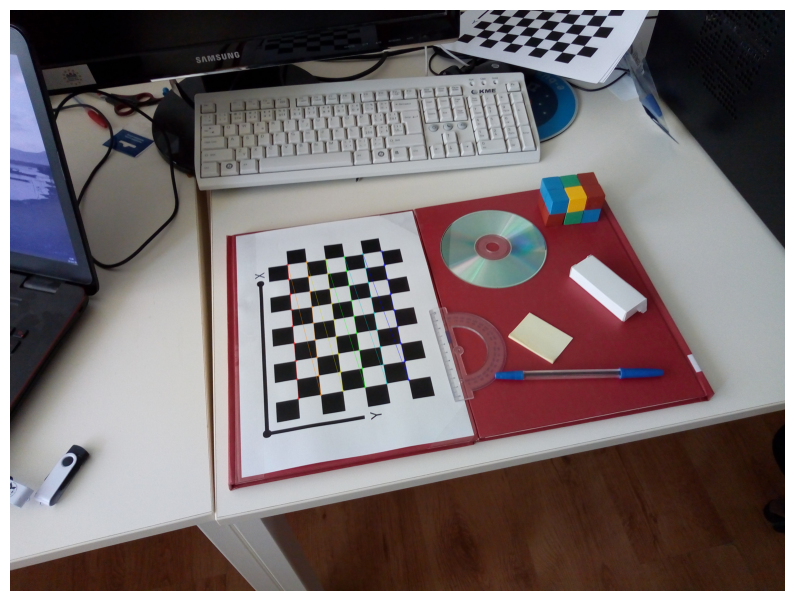

IMG_20181018_124627291.jpg


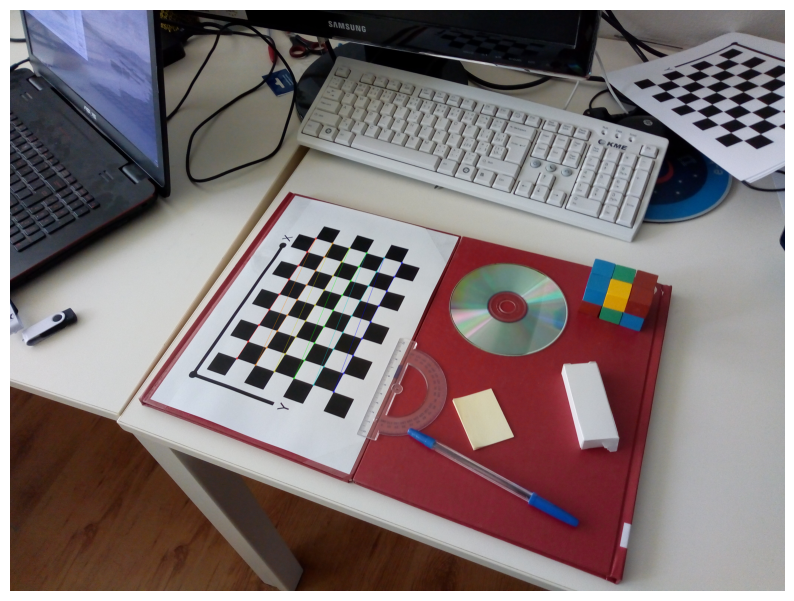

IMG_20181018_124629779.jpg


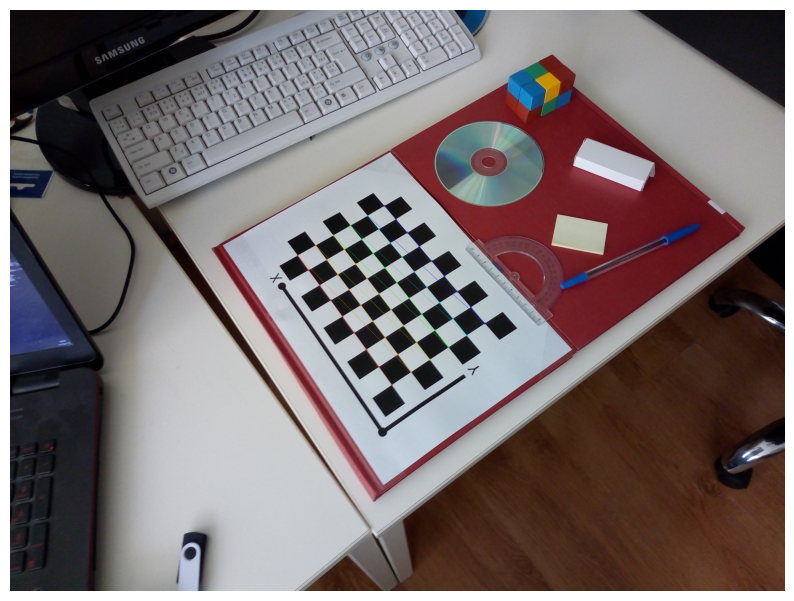

IMG_20181018_124637823.jpg


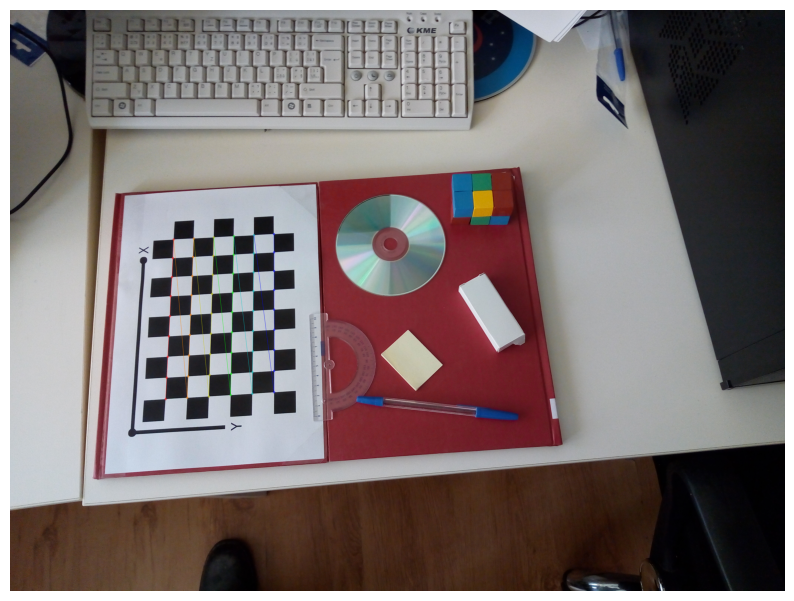

IMG_20181018_124642449.jpg


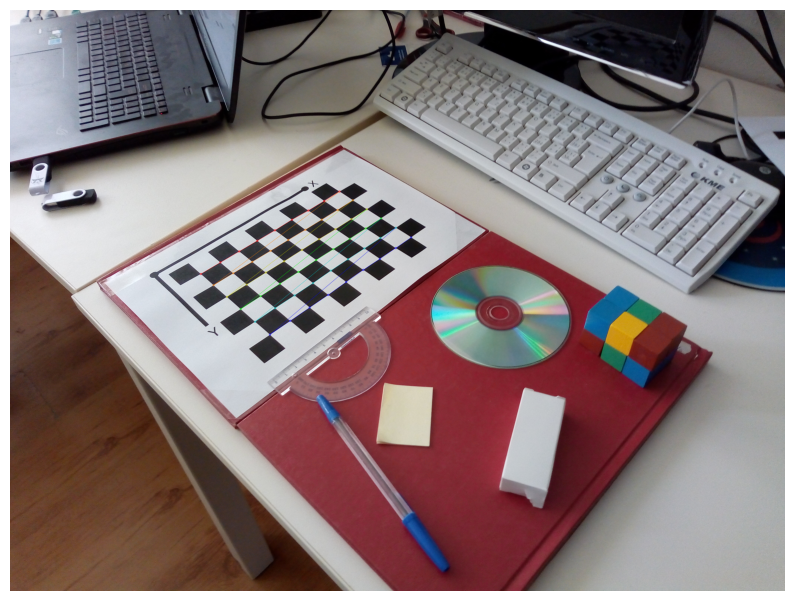

IMG_20181018_124645144.jpg


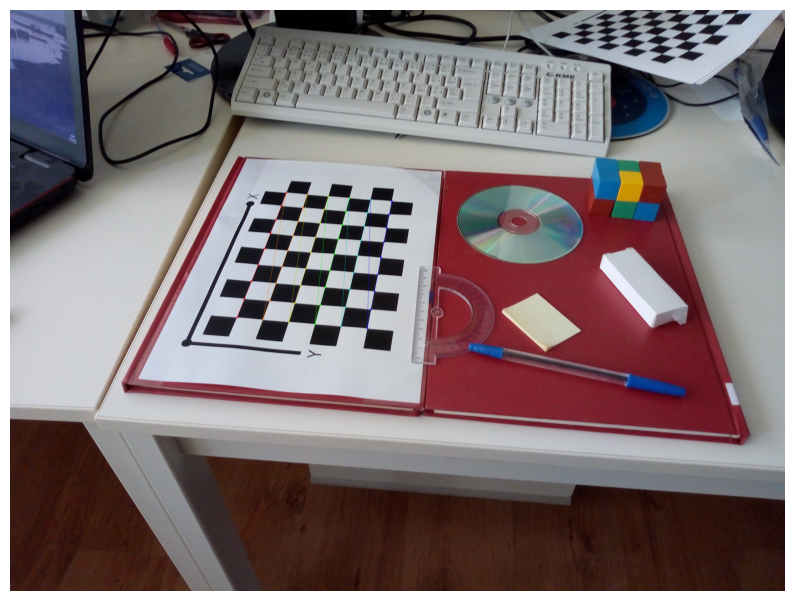

IMG_20181018_124649042.jpg


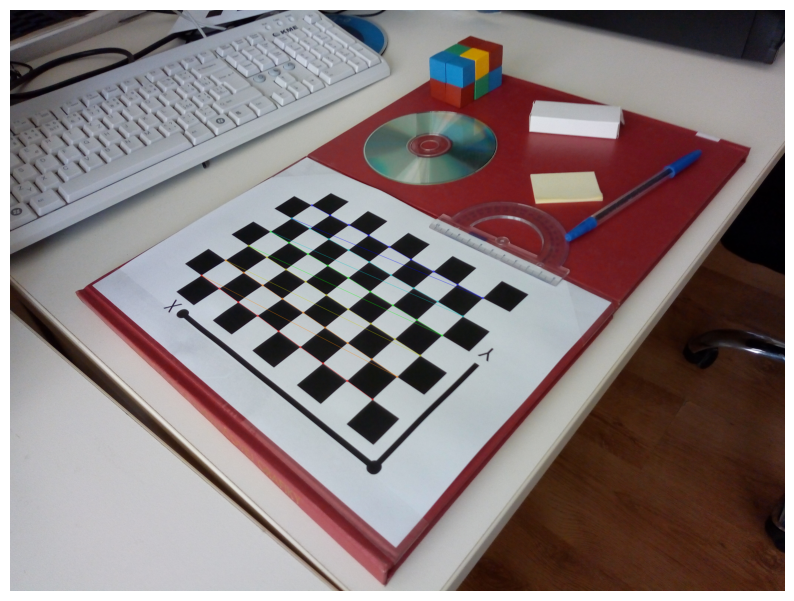

IMG_20181018_124659162.jpg


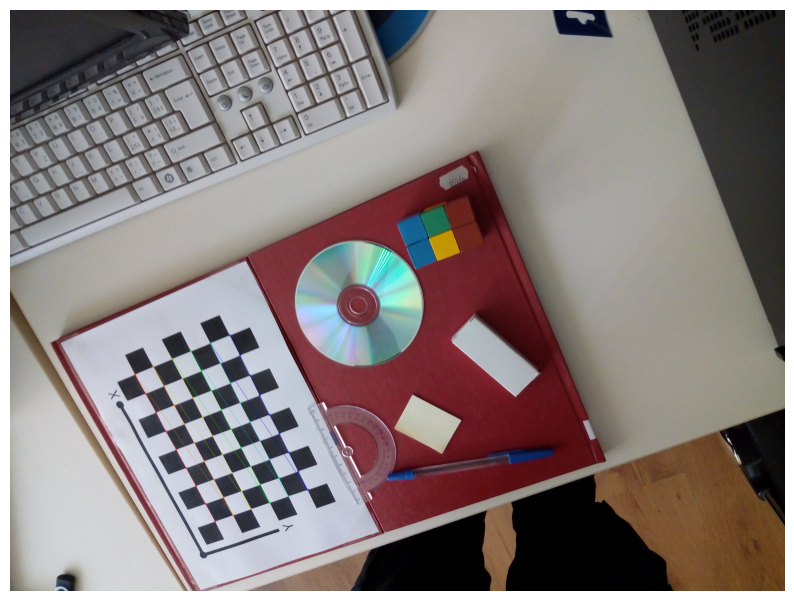

IMG_20181018_124706096.jpg


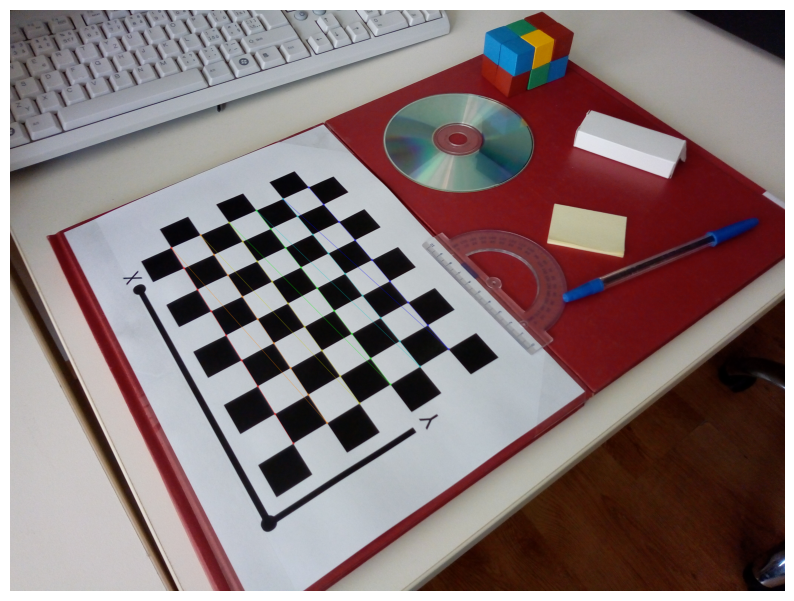

In [2]:
import cv2
import glob
import numpy as np
from matplotlib import pyplot as plt

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = 22 * np.mgrid[0:9,0:6].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
images = sorted(glob.glob('IMG_*.jpg'))
for fname in images:
    print(fname)
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)
        plt.figure(figsize = (10, 8))
        plt.imshow(cv2.drawChessboardCorners(img, (9, 6), corners2, ret)[:, :, ::-1])
        plt.axis("off")
        plt.show()


ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

******************************
Estimated K:
[[3.41456500e+03 0.00000000e+00 2.01560901e+03]
 [0.00000000e+00 3.42943840e+03 1.45426649e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
For image: IMG_20181018_124625122.jpg
Translation: [[-85.23746765 115.60455788 631.5343402 ]]
Rotation:
[[-0.15943304  0.98620254  0.04456074]
 [-0.75660247 -0.15106063  0.6361866 ]
 [ 0.63414021  0.0677144   0.77024733]]


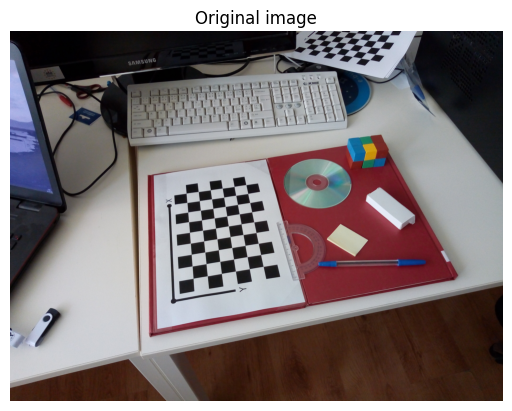

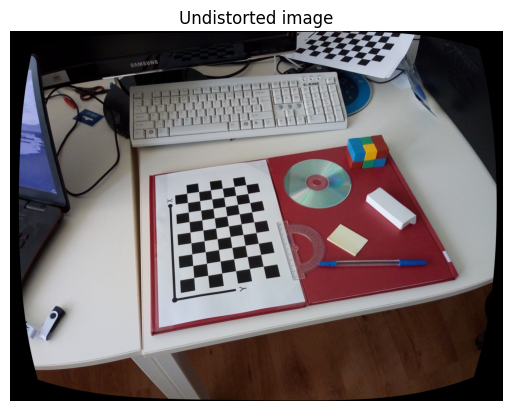

For image: IMG_20181018_124627291.jpg
Translation: [[-151.23437649   79.39177467  657.38235654]]
Rotation:
[[ 0.39157994  0.91719517  0.07360825]
 [-0.72811284  0.2599536   0.63425217]
 [ 0.5625983  -0.30195554  0.76961419]]


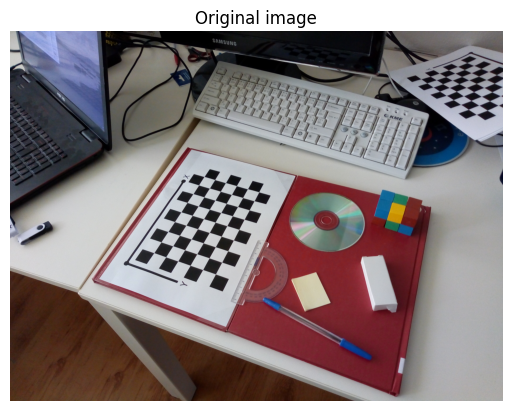

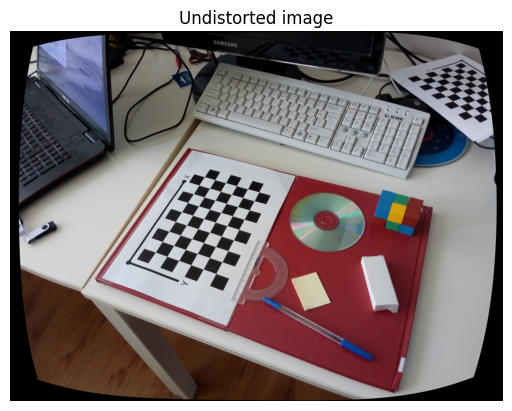

For image: IMG_20181018_124629779.jpg
Translation: [[  6.15712681  97.32330748 596.80062833]]
Rotation:
[[-0.55891876  0.82759072  0.05199438]
 [-0.70000056 -0.50450505  0.50544424]
 [ 0.44453239  0.24610617  0.8612913 ]]


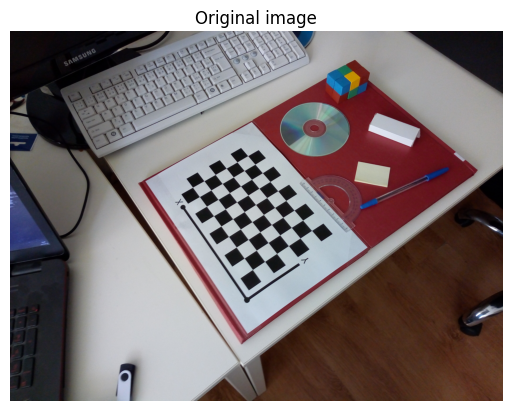

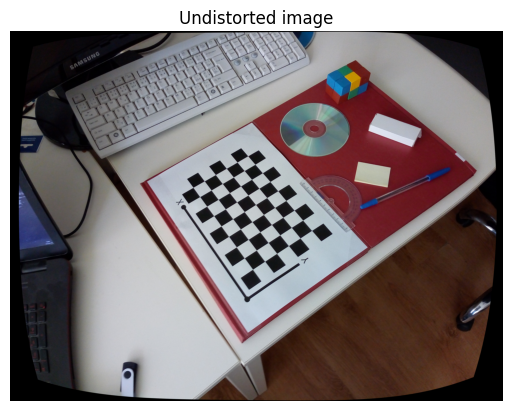

For image: IMG_20181018_124637823.jpg
Translation: [[-224.02933504  120.89538728  659.49040871]]
Rotation:
[[-0.05989576  0.99813563  0.01173704]
 [-0.94204653 -0.06041042  0.32999837]
 [ 0.33009217  0.00870867  0.94390853]]


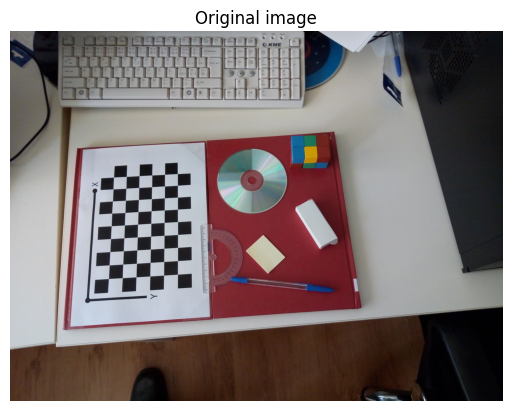

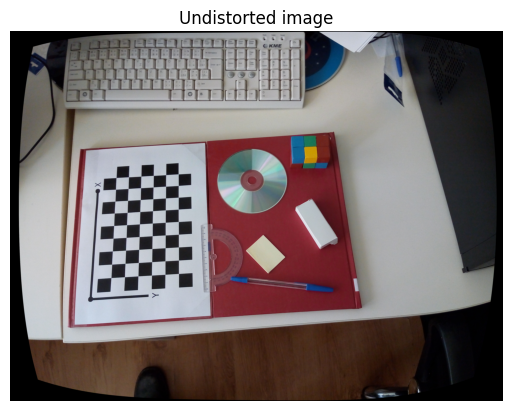

For image: IMG_20181018_124642449.jpg
Translation: [[-176.81077956   -5.98880895  619.21625041]]
Rotation:
[[ 0.7187765   0.69347224  0.04956406]
 [-0.51380183  0.48181679  0.70983115]
 [ 0.4683674  -0.53567605  0.70262589]]


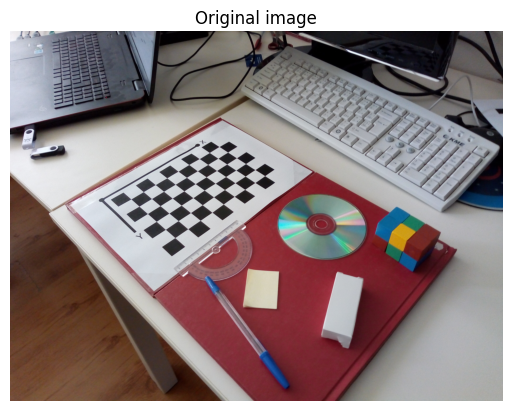

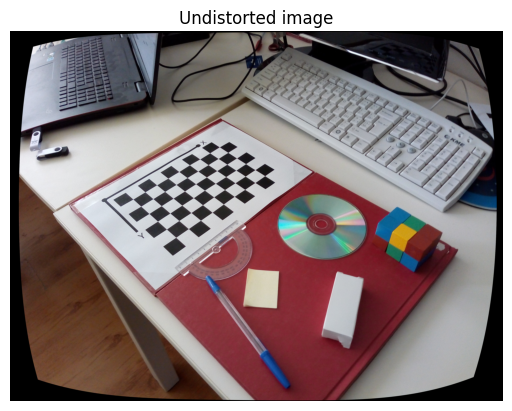

For image: IMG_20181018_124645144.jpg
Translation: [[-124.38002974   30.97471073  540.57231643]]
Rotation:
[[ 0.12377802  0.99227835  0.00791732]
 [-0.68771904  0.0800297   0.72155234]
 [ 0.71534714 -0.09475721  0.69231463]]


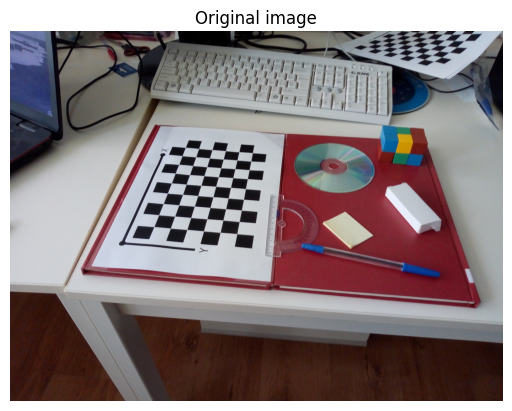

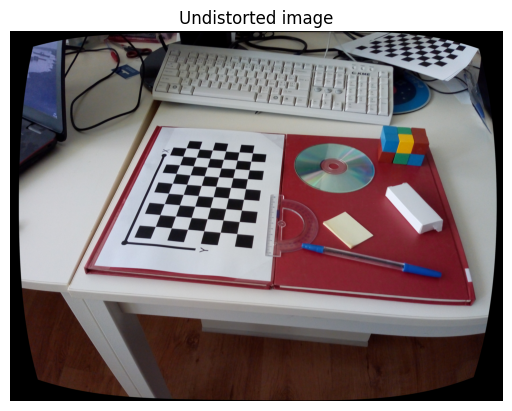

For image: IMG_20181018_124649042.jpg
Translation: [[ -7.65863085  71.25759925 384.37491477]]
Rotation:
[[-0.72969441  0.67945976  0.07668442]
 [-0.42350223 -0.5371416   0.72946883]
 [ 0.5368351   0.49981331  0.67970194]]


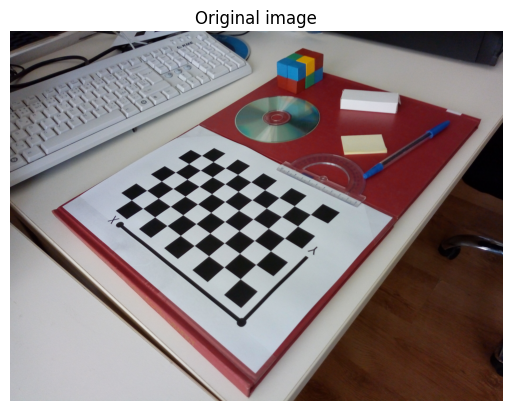

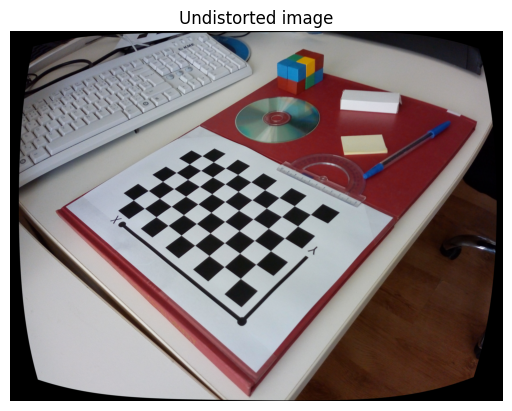

For image: IMG_20181018_124659162.jpg
Translation: [[-177.60804283  251.69718588  674.07640311]]
Rotation:
[[-0.40771003  0.90333673  0.13324894]
 [-0.8985796  -0.37099548 -0.2343439 ]
 [-0.1622567  -0.21527913  0.96297853]]


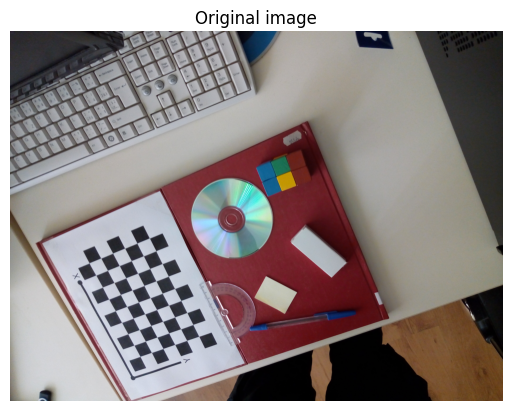

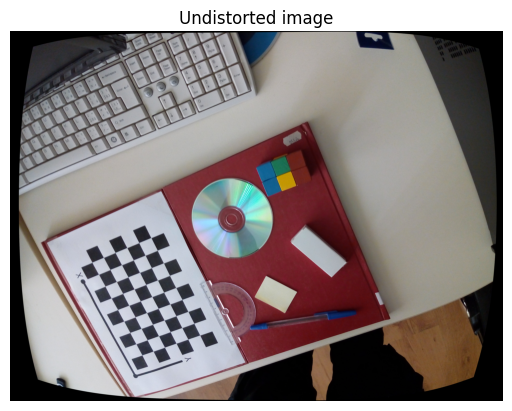

For image: IMG_20181018_124706096.jpg
Translation: [[-51.66139134  91.56155698 362.52472663]]
Rotation:
[[-0.55829089  0.82961015  0.00763433]
 [-0.6471804  -0.44124445  0.62165977]
 [ 0.51910386  0.34212619  0.78325019]]


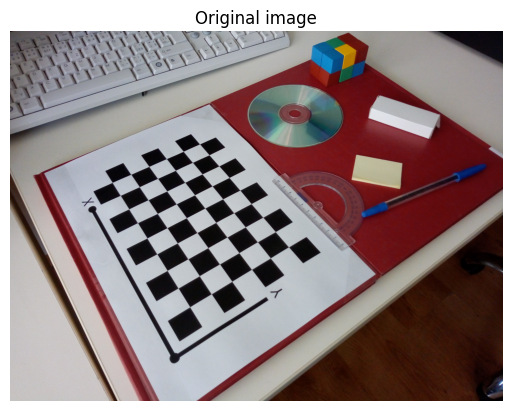

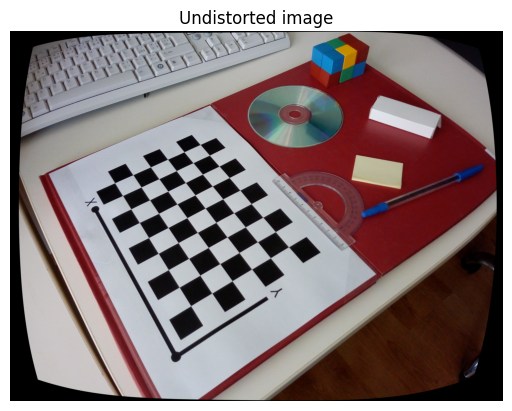

In [3]:
print(30 * '*')
print("Estimated K:")
print(mtx)
for i, fname in enumerate(images):
  print("For image:", fname)
  print("Translation:", tvecs[i].T)
  print("Rotation:")
  print(cv2.Rodrigues(rvecs[i])[0])

  img = cv2.imread(fname)
  h,  w = img.shape[:2]


  plt.imshow(img[:, :, ::-1])
  plt.title("Original image")
  plt.axis("off")
  plt.show()

  dst = cv2.undistort(img, mtx, dist, None, mtx)
  plt.imshow(dst[:, :, ::-1])
  plt.title("Undistorted image")
  plt.axis("off")
  plt.show()

  if i == 0:
    cv2.imwrite("projection_exercise.png", dst)

  if i == 1:
    cv2.imwrite("triangulation_exercise_1.png", dst)
  if i == 2:
    cv2.imwrite("triangulation_exercise_2.png", dst)